### I'll start with importing the data and it's dictionary. I'll also import the necessary libraries.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ipywidgets import widgets
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file
import ppscore as pps
from IPython.display import display, Math
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score, confusion_matrix
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_csv('airline_passenger_satisfaction.csv')
dict = pd.read_csv('data_dictionary.csv', index_col= 'Field')
display(Math('The \ next \ table \ describes \ each \ column.'))
display(dict)
#make a dataframe display in full width
pd.set_option('display.max_columns', None)


<IPython.core.display.Math object>

,Description
Field,
ID,Unique passenger identifier
Gender,Gender of the passenger (Female/Male)
Age,Age of the passenger
Customer Type,Type of airline customer (First-time/Returning)
Type of Travel,Purpose of the flight (Business/Personal)
Class,Travel class in the airplane for the passenger...
Flight Distance,Flight distance in miles
Departure Delay,Flight departure delay in minutes
Arrival Delay,Flight arrival delay in minutes


In [3]:
df.head()

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,3,4,3,3,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,2,3,5,2,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,4,4,5,4,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,2,3,4,2,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,3,3,5,3,3,4,4,5,4,3,3,3,3,Satisfied


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  object 
 2   Age                                     129880 non-null  int64  
 3   Customer Type                           129880 non-null  object 
 4   Type of Travel                          129880 non-null  object 
 5   Class                                   129880 non-null  object 
 6   Flight Distance                         129880 non-null  int64  
 7   Departure Delay                         129880 non-null  int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

$\rightarrow$ Non-numeric data types will need a little tweak.

$\rightarrow$ There're a little obvious null values in `Arrival Delay`. I'll fill them later on.

In [5]:
df.describe()

,ID,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,64940.500000,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,37493.270818,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,32470.750000,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,64940.500000,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,97410.250000,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,129880.000000,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


$\rightarrow$ `Satisfaction` is the target variable, it mainly indicates the overall satisfaction level with the airline.

$\rightarrow$ `ID` in this data works as an index, it's mostly useless, so I'll drop it.

$\rightarrow$ `Flight distance` is in miles, we need to keep an eye on that for later.

$\rightarrow$ `Departure Delay` is mostly 0, third quartile is 12, max is 1592, feels promising.

$\rightarrow$ `Arrival Delay` is mostly 0, third quartile is 13, max is 1584, could be used with the above to indicate something.

$\rightarrow$ `Departure and Arrival Time Convenience` could be a strong indicator of the target, satisfaction.

$\rightarrow$ The rest of columns are basically levels of satisfaction about specific things, ideally, the target should be a weighted mean of these.

#### Now that we've, kind of, achieved a sense of the problem and framed it, we got the data, and had a quick look at it, now it's time to dive in!

<center><img src = 'meme.jpg' style="width: 27vw;"/></center>

In [6]:
#Here I'll use a GUI-based library to automate some of the EDA manual labour
eda = df.sample(4000).copy()     #a sample copy of the data for EDA, visualizations, and whatnot
#Set categorical fetures dtype to categorical
num_cols = eda.select_dtypes(include=np.number).columns
cat_cols = eda.select_dtypes(exclude=np.number).columns
eda[cat_cols] = df[cat_cols].astype('category')


profile = ProfileReport(eda, title="Airline Passenger Satisfaction", html={"style": {"full_width": True}}, sort=None)
profile.to_file('report.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Insights: 
* There're many correlated features, we're probably not going to use all of them, or we may _reduce_ them.
* `Departure Delay` and `Arrival Delay` have more than 56% zeros, counts exponentially decay after 0, and are highly correlated, our future model will probably be sensitive to this feature, or at least one of them.
* Other zeros are expected to affect the target directly.
* Male-Female ratio is roughly 1.
* Age is roughly normally distributed.
* Returning customers are about 4x the first-timers.
* Business travellers are almost 2x the personal travellers. _Returners and business travellers might be correlated, as well as personal's but maybe not as much_.
* Bussiness class has almost half of the passengers, makes sense given the data above.
* `Flight Distance` is right skewed (s = __1.0868181__) , heavy tailed, exponentially-decaying, with max of 4502 miles and 3369 for 95-th percentile, difenately a feature to keep an eye on.
* `Departure and Arrival Time Convenience` is log-like distributed.
* `Ease of Online Booking` is almost normally disributed.
* Almost all other features are normally disributed and need no more attention, it look like this data was someone's favourite project.
* `Satisfaction` look a little bit imbalanced, it would be better to use imbalanced-proof algorithms, it's linearly correlated the most with `Online Boarding`, `In-flight wifi service`, `Class`, and a few others.
* Correlations seems interesting, we shall go deeper into them.

_*Categorical features are interpreted in terms of frequency_*

#### Up-till now, we had a look at each attribute and its characteristics, visualized the some data, saw some correlations, had a sense of the data, identified the target variable, and framed the problem.

In [7]:
ppMat = pps.matrix(eda.drop(['ID'], axis = 1))
ppMat

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,Gender,Gender,1.000000e+00,predict_itself,True,None,0.00000,1.000000,None
1,Gender,Age,0.000000e+00,regression,True,mean absolute error,12.68200,12.687965,DecisionTreeRegressor()
2,Gender,Customer Type,2.338223e-07,classification,True,weighted F1,0.73158,0.731580,DecisionTreeClassifier()
3,Gender,Type of Travel,0.000000e+00,classification,True,weighted F1,0.56650,0.557592,DecisionTreeClassifier()
4,Gender,Class,0.000000e+00,classification,True,weighted F1,0.43925,0.303504,DecisionTreeClassifier()
...,...,...,...,...,...,...,...,...,...
524,Satisfaction,In-flight Service,0.000000e+00,regression,True,mean absolute error,0.88500,0.895910,DecisionTreeRegressor()
525,Satisfaction,In-flight Wifi Service,1.623451e-02,regression,True,mean absolute error,1.09475,1.076977,DecisionTreeRegressor()
526,Satisfaction,In-flight Entertainment,1.375822e-01,regression,True,mean absolute error,1.14100,0.984019,DecisionTreeRegressor()
527,Satisfaction,Baggage Handling,0.000000e+00,regression,True,mean absolute error,0.89125,0.906004,DecisionTreeRegressor()


In [8]:
ppscore = ppMat[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')

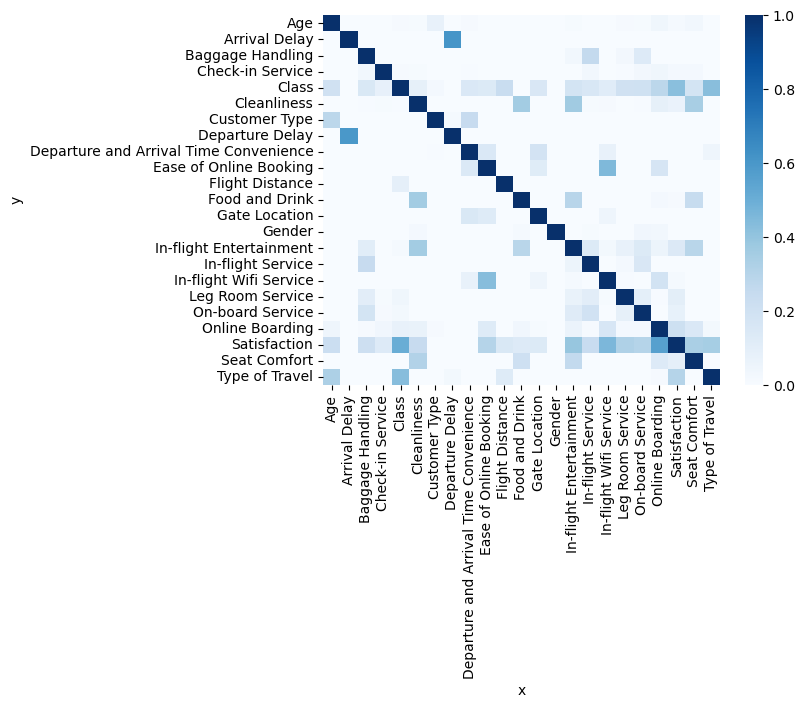

In [9]:
sns.heatmap(ppscore, annot=False, cmap='Blues');

In [10]:
ppMat[ppMat.y == 'Satisfaction'].model.mode() #I'll use this model after the dummy predictor

0    DecisionTreeClassifier()
Name: model, dtype: object

#### Nonlinear and linear correlations are almost identical, that means that `Satisfaction` is most likely linearly dependent on the other features, hence we may try LogisticRegression model as well as the chosen DecisionTreeClassifier after we set the dummy predictor up and before trying other models.

In [11]:
eda

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
55781,55782,Female,28,Returning,Personal,Economy,646,0,0.0,3,4,4,4,2,3,1,3,1,1,1,4,1,5,Satisfied
97381,97382,Male,68,Returning,Personal,Economy,1020,5,5.0,2,2,1,2,2,3,3,2,3,3,2,2,3,2,Neutral or Dissatisfied
50179,50180,Female,22,First-time,Business,Economy,109,235,235.0,1,3,1,1,2,1,1,3,1,3,4,3,3,3,Neutral or Dissatisfied
104804,104805,Female,56,Returning,Personal,Economy,587,6,0.0,5,2,3,4,2,2,5,2,4,3,2,2,2,2,Neutral or Dissatisfied
77182,77183,Female,32,Returning,Business,Business,2502,0,0.0,0,0,4,5,2,5,5,4,5,5,4,0,5,5,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60014,60015,Female,19,Returning,Personal,Economy,997,0,0.0,4,1,5,1,4,5,3,4,3,3,5,1,3,4,Neutral or Dissatisfied
93023,93024,Female,7,Returning,Personal,Economy,1524,48,46.0,3,3,4,3,4,4,2,3,2,2,4,2,2,4,Neutral or Dissatisfied
104123,104124,Male,60,Returning,Business,Business,3433,21,7.0,3,3,5,5,3,5,4,5,5,4,5,3,5,5,Satisfied
97171,97172,Female,24,Returning,Personal,Economy,1313,3,0.0,3,4,1,4,4,4,5,2,5,5,3,3,5,4,Neutral or Dissatisfied


In [12]:
edah = eda[num_cols[1:5]].copy()
edah['TARGET'] = eda['Satisfaction']
edah.head()

,Age,Flight Distance,Departure Delay,Arrival Delay,TARGET
55781,28,646,0,0.0,Satisfied
97381,68,1020,5,5.0,Neutral or Dissatisfied
50179,22,109,235,235.0,Neutral or Dissatisfied
104804,56,587,6,0.0,Neutral or Dissatisfied
77182,32,2502,0,0.0,Satisfied


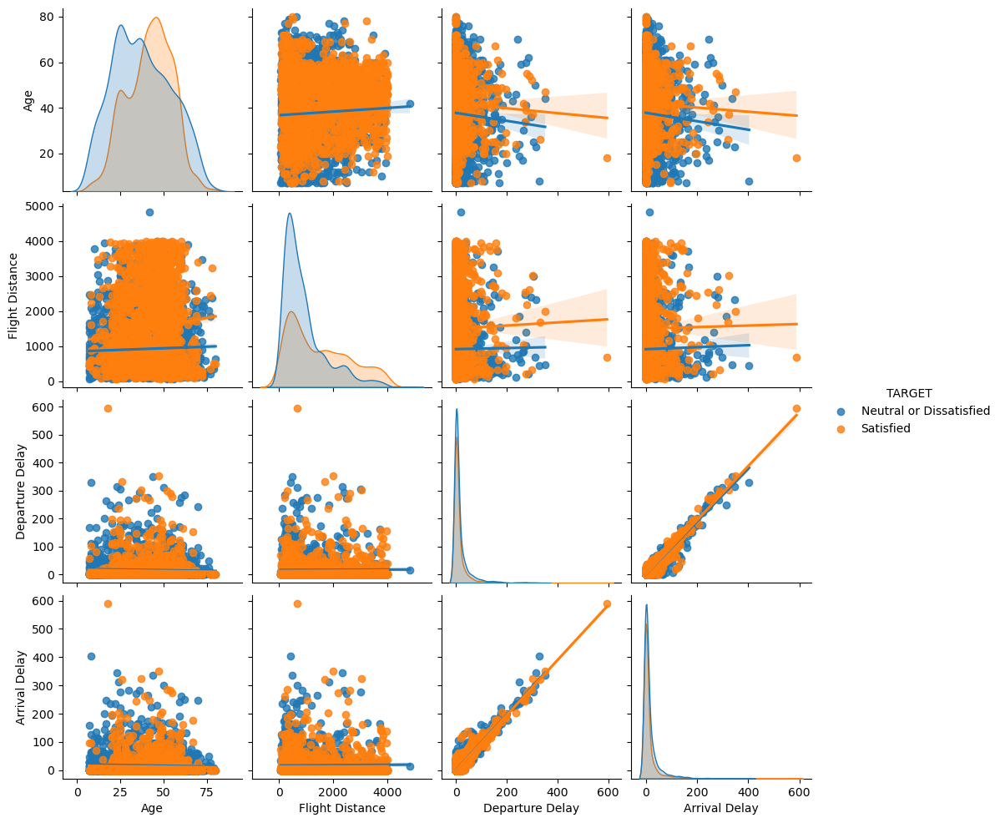

In [13]:
sns.pairplot(edah, diag_kind='kde', height=2.5, hue= 'TARGET', kind= 'reg');

$\rightarrow$ Departure and Arrival delays seems to have low impact, and that's because of the scarcity of the delays, but it's obvious that dissatisfaction is correlated with delays.

$\rightarrow$ Flight distance seems inversely proportional, given the cross-over point near 2000 miles, hence customers seems to be more satisfied with flights of more than 2000 miles and very critical with the shorter ones.

$\rightarrow$ Age is clearly bimodal and need attention, people in their mid-age seem to be more satisfied though, and the younger and older customers seems to be more critical, and that makes sense, given their needs.

$\Rightarrow$ Age bimodality needs to be addressed, maybe with rbf kernel, Flight distance and the delays may be transformed using exponential-like function.

$\Rightarrow$ The almost-identical features will be most likely automatically dropped on using PCA.

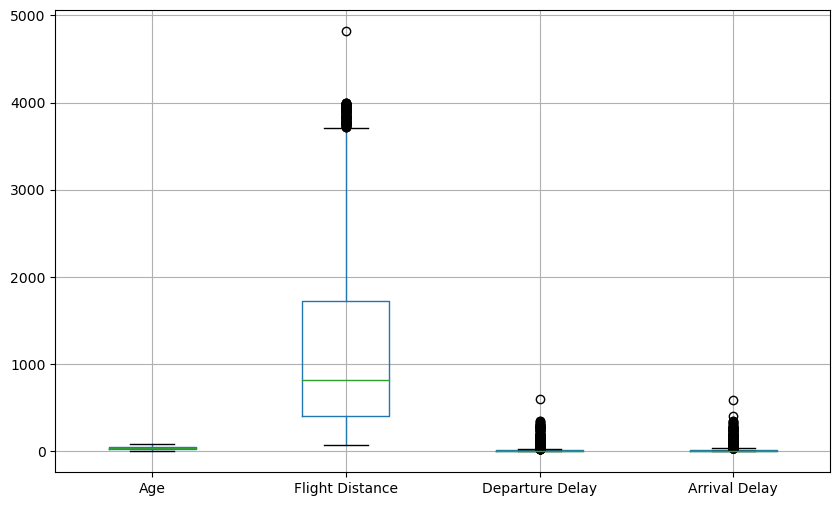

In [14]:
edah.boxplot(figsize=(10, 6));

$\rightarrow$ Ok, delays have many outliers and that's mainly because of their distributions, transforming them will fix most of them.

$\rightarrow$ `Flight distance` outliers needs to be addressed.

In [15]:
def addressOutliers(data_train, l = 0.25, h = 0.75):
    #drop the outliers
    for i in data_train.select_dtypes(include=np.number).columns:
        q1 = data_train[i].quantile(l)
        q3 = data_train[i].quantile(h)
        iqr = q3 - q1
        data_train = data_train[(data_train[i] > q1 - 1.5 * iqr) & (data_train[i] < q3 + 1.5 * iqr)]

    #boxplot
    data_train.boxplot(figsize=(10, 6));
    return data_train

,Age,Flight Distance,Departure Delay,Arrival Delay,TARGET
55781,28,646,0,0.0,Satisfied
97381,68,1020,5,5.0,Neutral or Dissatisfied
104804,56,587,6,0.0,Neutral or Dissatisfied
77182,32,2502,0,0.0,Satisfied
50308,58,1904,0,8.0,Neutral or Dissatisfied
...,...,...,...,...,...
4588,41,416,0,0.0,Neutral or Dissatisfied
119887,30,912,0,7.0,Neutral or Dissatisfied
60014,19,997,0,0.0,Neutral or Dissatisfied
104123,60,3433,21,7.0,Satisfied


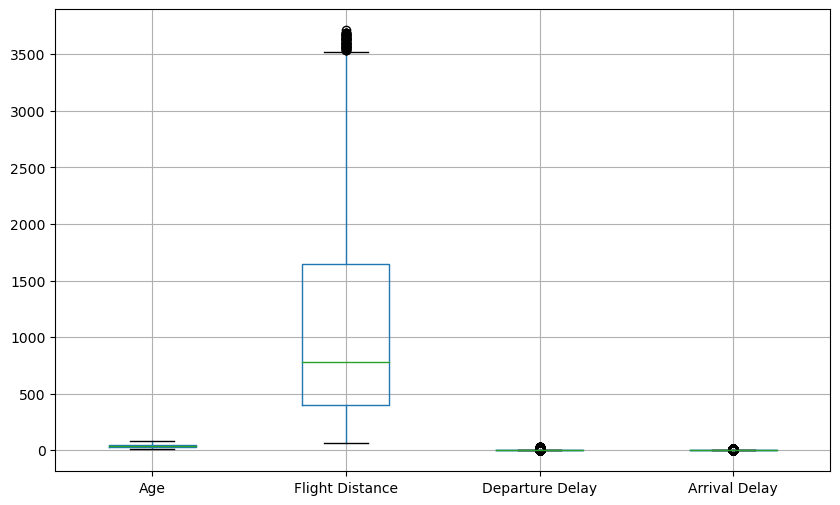

In [16]:
addressOutliers(edah)

In [17]:
#Since the data is moslty clean but need some preparation, it's splitting time!
X, y = df.drop(['ID', 'Satisfaction'], axis = 1), df['Satisfaction']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify= X.Class)
display(Math("There're \ {} \ nulls \ in \ the \ train \ set".format(X_train.isna().sum().sum())))
X_train.head()

<IPython.core.display.Math object>

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
118966,Female,60,Returning,Personal,Economy,570,0,0.0,4,4,3,5,3,3,5,4,5,4,3,4,3,3
17060,Male,31,Returning,Personal,Economy,1134,0,0.0,5,2,5,2,3,5,3,2,3,3,5,2,3,4
43024,Male,58,Returning,Business,Business,259,0,0.0,3,3,2,3,3,3,3,3,4,1,3,3,3,3
30945,Male,12,Returning,Business,Business,3634,31,23.0,5,5,4,3,5,2,3,2,3,3,3,3,3,3
83574,Female,27,First-time,Business,Business,936,0,0.0,4,4,5,4,5,3,3,2,3,3,4,4,3,4


In [18]:
def prepare(data):
    '''Data preparation function'''
    #Ordinal Encode Gender, Customer Type, and Type of Travel	
    #OneHotEncode Class
    OrdEnc = OrdinalEncoder(dtype= int)
    OneHotEnc = OneHotEncoder(dtype= int, sparse= False)
    data[['Gender', 'Customer Type', 'Type of Travel']] = OrdEnc.fit_transform(data[['Gender', 'Customer Type', 'Type of Travel']])
    data[['Business', 'Eco', 'Eco Plus']] = OneHotEnc.fit_transform(data[['Class']])
    data = data.drop(['Class'], axis = 1)

    #Impute missing values with KNNImputer
    KNNImp = KNNImputer()
    data = pd.DataFrame(KNNImp.fit_transform(data), columns= data.columns)

    #Scaling features, just in case
    sclr = StandardScaler()
    data[num_cols[1:]] = pd.DataFrame(sclr.fit_transform(data[num_cols[1:]]), columns= num_cols[1:])
    
    return data

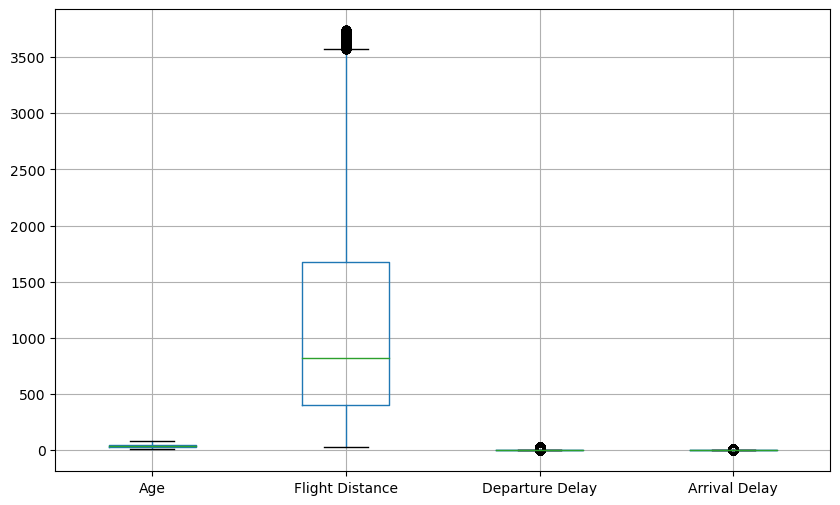

In [19]:
X_trainP = X_train.copy()
X_trainP[num_cols[1:5]] = addressOutliers(X_train[num_cols[1:5]])

In [20]:
X_trainP = prepare(X_trainP)

In [21]:
def preparey(data):
    enc = LabelEncoder()
    data = enc.fit_transform(data)
    return data

In [22]:
y_trainP = preparey(y_train)

In [23]:
def crVal(estimator,X, y, cv=10, scoring=['f1', 'accuracy'], return_train_score=True):
    from sklearn.model_selection import cross_validate
    scores = cross_validate(estimator, X, y, cv = cv, scoring=['f1', 'accuracy', 'roc_auc_ovr'], return_train_score=True)
    scores = pd.DataFrame(scores).describe().T.drop(['count'], axis=1).drop(['fit_time', 'score_time'], axis=0)
    display(scores)
    return scores

In [24]:
def conf_mat(estimator, scores, X, y):

    #confusion matrix
    from sklearn.metrics import confusion_matrix
    y_pred = estimator.predict(X)

    #plot confusion matrix
    conf_mat = confusion_matrix(y, y_pred)
    fig, ax = plt.subplots(figsize=(3, 3))
    ax.matshow(conf_mat, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(conf_mat.shape[0]):
        for j in range(conf_mat.shape[1]):
            ax.text(x=j, y=i, s=conf_mat[i, j], va='center', ha='center')

    #text on plot
    plt.text(-1, 2, 'score: {:.3f} ± {:.3f}'.format(scores.iloc[2, 0], scores.iloc[2, 1]), color='green')
    plt.xlabel('predicted label')
    plt.ylabel('true label')
    plt.title('Confusion Matrix ' + str(estimator).split('(')[0])
    plt.tight_layout()
    plt.show()
        

In [25]:
def roc_curve(estimator, scores, X, y):
    #roc curve
    from sklearn.metrics import roc_curve, roc_auc_score
    y_pred_proba = estimator.predict_proba(X)[:,1]
    fpr, tpr, thresholds = roc_curve(y, y_pred_proba)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr, tpr, label='')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve ' + str(estimator).split('(')[0])
    plt.text(0.6, 0, 'AUC: {:.3f} ± {:.3f}'.format(scores.iloc[4, 0], scores.iloc[4, 1]), color='green')
    plt.show()

In [26]:
def pack(e, s, X_trainP, y_trainP):
    conf_mat(e, s, X_trainP, y_trainP)
    roc_curve(e, s, X_trainP, y_trainP)

In [27]:
dummy_clf = DummyClassifier()
dummyscores = crVal(dummy_clf, X_trainP, y_trainP)
dummy_clf.fit(X_trainP, y_trainP);

,mean,std,min,25%,50%,75%,max
test_f1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
train_f1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
test_accuracy,0.566003,0.000028,0.565971,0.565971,0.566025,0.566025,0.566025
train_accuracy,0.566003,0.000003,0.566001,0.566001,0.566001,0.566007,0.566007
test_roc_auc_ovr,0.500000,0.000000,0.500000,0.500000,0.500000,0.500000,0.500000
train_roc_auc_ovr,0.500000,0.000000,0.500000,0.500000,0.500000,0.500000,0.500000


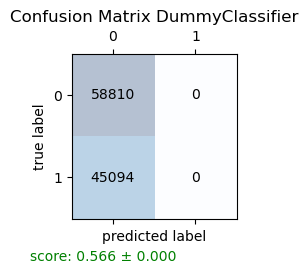

In [28]:
conf_mat(dummy_clf, dummyscores, X_trainP, y_trainP)

In [29]:
lr = LogisticRegression()
lrscores = crVal(lr, X_trainP, y_trainP)
lr.fit(X_trainP, y_trainP);

,mean,std,min,25%,50%,75%,max
test_f1,0.853147,0.005126,0.847246,0.849379,0.851913,0.855905,0.862151
train_f1,0.853310,0.000615,0.852198,0.853096,0.853458,0.853674,0.854032
test_accuracy,0.875019,0.004061,0.870561,0.872164,0.873677,0.877030,0.882676
train_accuracy,0.875149,0.000506,0.874254,0.874978,0.875265,0.875440,0.875696
test_roc_auc_ovr,0.927584,0.004371,0.922137,0.924628,0.925368,0.931705,0.934211
train_roc_auc_ovr,0.927686,0.000498,0.926903,0.927241,0.927912,0.928021,0.928315


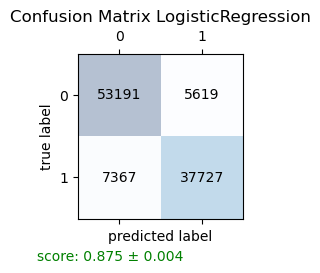

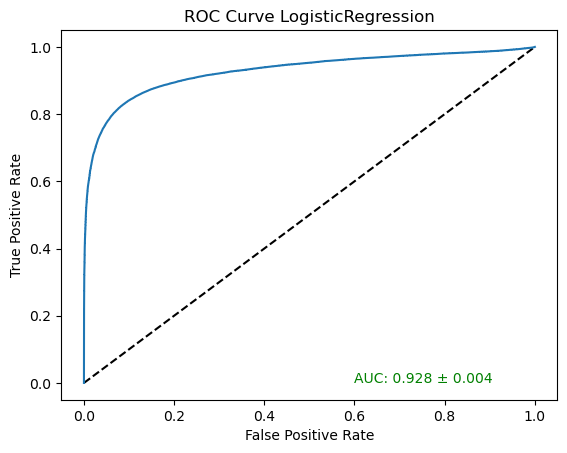

In [30]:
pack(lr, lrscores, X_trainP, y_trainP)

In [31]:
dtc = DecisionTreeClassifier()
dtcscores = crVal(dtc, X_trainP, y_trainP)
dtc.fit(X_trainP, y_trainP);

,mean,std,min,25%,50%,75%,max
test_f1,0.934076,2.374113e-03,0.930371,0.932464,0.933562,0.935651,0.937902
train_f1,0.999940,1.225216e-05,0.999926,0.999926,0.999945,0.999951,0.999951
test_accuracy,0.942610,2.176548e-03,0.939371,0.940977,0.942111,0.944231,0.946102
train_accuracy,0.999948,1.063388e-05,0.999936,0.999936,0.999952,0.999957,0.999957
test_roc_auc_ovr,0.941946,1.991966e-03,0.938658,0.940735,0.941632,0.943055,0.945140
train_roc_auc_ovr,1.000000,2.309930e-09,1.000000,1.000000,1.000000,1.000000,1.000000


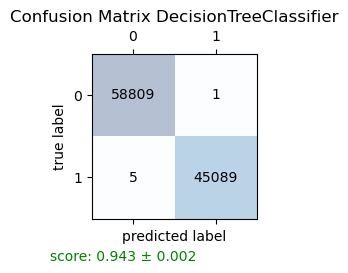

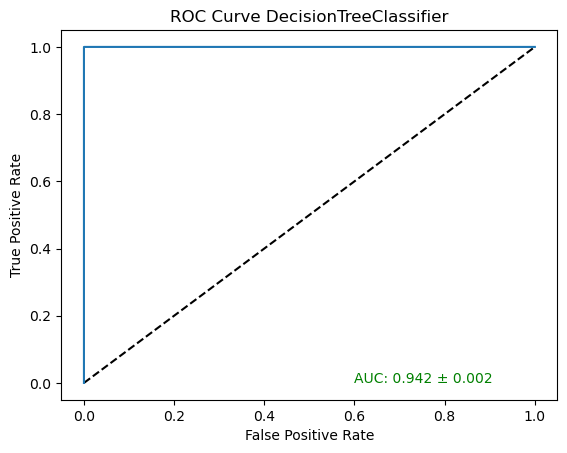

In [32]:
pack(dtc, dtcscores, X_trainP, y_trainP)

In [33]:
rndfst = RandomForestClassifier()
rndfstscores = crVal(rndfst, X_trainP, y_trainP)
rndfst.fit(X_trainP, y_trainP);

,mean,std,min,25%,50%,75%,max
test_f1,0.954440,2.681947e-03,0.951316,0.952327,0.954122,0.956218,0.959613
train_f1,0.999936,1.398606e-05,0.999914,0.999926,0.999932,0.999951,0.999951
test_accuracy,0.961099,2.308700e-03,0.958522,0.959241,0.960731,0.962633,0.965448
train_accuracy,0.999944,1.214017e-05,0.999925,0.999936,0.999941,0.999957,0.999957
test_roc_auc_ovr,0.993239,5.152544e-04,0.992430,0.992990,0.993103,0.993707,0.993967
train_roc_auc_ovr,1.000000,1.584535e-07,1.000000,1.000000,1.000000,1.000000,1.000000


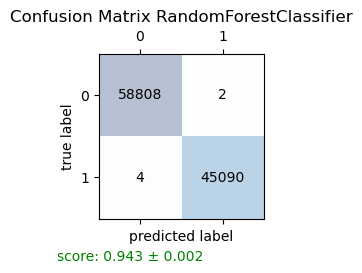

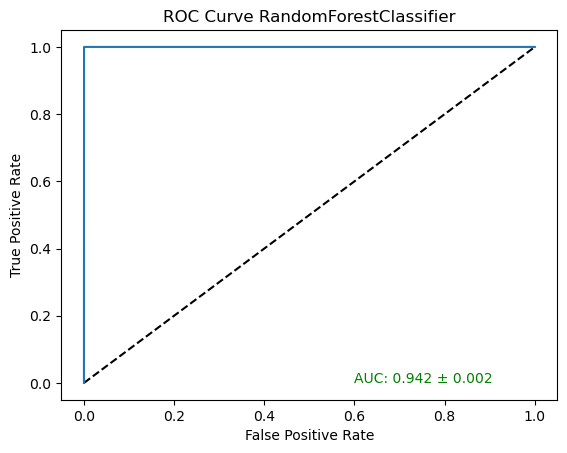

In [34]:
pack(rndfst, dtcscores, X_trainP, y_trainP)

#### As always, I really like how RandomForest scored, I'm going to go with it. Let's start tuning.

In [35]:
X_testP = prepare(X_test)
y_testP = preparey(y_test)
y_pred = rndfst.predict(X_testP)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

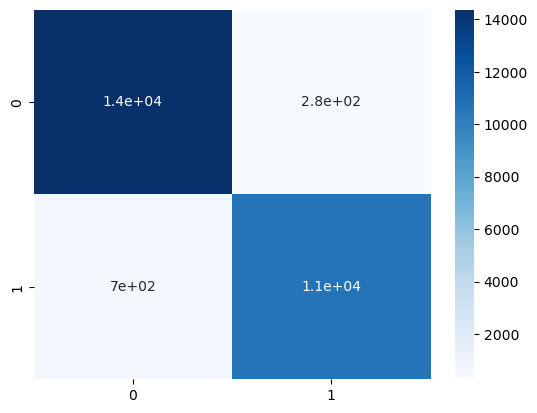

In [36]:
sns.heatmap(confusion_matrix(y_testP, y_pred), annot=True, cmap='Blues', );
display(Math("F1 \ score: \ {}".format(f1_score(y_testP, y_pred))))
display(Math("ROC/AUC \ score \ {}".format(roc_auc_score(y_testP, y_pred))))
display(Math("Accuracy: \ {}".format(accuracy_score(y_testP, y_pred))))

#### Well, that's it!